## 1. Import Libraries

In [32]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import json
import os
import random
import datetime

import tensorflow as tf
from tensorflow import keras

from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns


## 2. Data Processing

In [33]:
# # download dataset
# !kaggle datasets download -d ikarus777/best-artworks-of-all-time


In [34]:
# # unzip dataset.zip
# import zipfile

# # Define the path to your zip file
# file_path = 'best-artworks-of-all-time.zip'  # Replace your file's name

# # Unzip the file to a specific destination
# with zipfile.ZipFile(file_path, 'r') as zip_ref:
#     zip_ref.extractall('best-artworks-of-all-time')  # Replace your desired folder

In [35]:
artists = pd.read_csv('best-artworks-of-all-time/artists.csv')
artists.shape

(50, 8)

In [36]:
artists.head()

,id,name,years,genre,nationality,bio,wikipedia,paintings
0,0,Amedeo Modigliani,1884 - 1920,Expressionism,Italian,Amedeo Clemente Modigliani (Italian pronunciat...,http://en.wikipedia.org/wiki/Amedeo_Modigliani,193
1,1,Vasiliy Kandinskiy,1866 - 1944,"Expressionism,Abstractionism",Russian,Wassily Wassilyevich Kandinsky (Russian: Васи́...,http://en.wikipedia.org/wiki/Wassily_Kandinsky,88
2,2,Diego Rivera,1886 - 1957,"Social Realism,Muralism",Mexican,Diego María de la Concepción Juan Nepomuceno E...,http://en.wikipedia.org/wiki/Diego_Rivera,70
3,3,Claude Monet,1840 - 1926,Impressionism,French,Oscar-Claude Monet (; French: [klod mɔnɛ]; 14 ...,http://en.wikipedia.org/wiki/Claude_Monet,73
4,4,Rene Magritte,1898 - 1967,"Surrealism,Impressionism",Belgian,René François Ghislain Magritte (French: [ʁəne...,http://en.wikipedia.org/wiki/René_Magritte,194


In [37]:
# Check directory existence and remove non-existent entries

images_dir = 'best-artworks-of-all-time/images/images'

del_items = []
for idx, row in artists.iterrows():
    name_path = row["name"].replace(' ', '_')
    if os.path.exists(os.path.join(images_dir, name_path)): 
        print(f"Found --> {os.path.join(images_dir, name_path)}")
    else:
        print(f"Did not find --> {os.path.join(images_dir, name_path)}")
        artists = artists.drop(idx)
        print(f"---{name_path} removed from artists---")
        del_items.append(name_path)
print(f"not found: {del_items} ---count: {len(del_items)}")


Found --> best-artworks-of-all-time/images/images\Amedeo_Modigliani
Found --> best-artworks-of-all-time/images/images\Vasiliy_Kandinskiy
Found --> best-artworks-of-all-time/images/images\Diego_Rivera
Found --> best-artworks-of-all-time/images/images\Claude_Monet
Found --> best-artworks-of-all-time/images/images\Rene_Magritte
Found --> best-artworks-of-all-time/images/images\Salvador_Dali
Found --> best-artworks-of-all-time/images/images\Edouard_Manet
Found --> best-artworks-of-all-time/images/images\Andrei_Rublev
Found --> best-artworks-of-all-time/images/images\Vincent_van_Gogh
Found --> best-artworks-of-all-time/images/images\Gustav_Klimt
Found --> best-artworks-of-all-time/images/images\Hieronymus_Bosch
Found --> best-artworks-of-all-time/images/images\Kazimir_Malevich
Found --> best-artworks-of-all-time/images/images\Mikhail_Vrubel
Found --> best-artworks-of-all-time/images/images\Pablo_Picasso
Found --> best-artworks-of-all-time/images/images\Peter_Paul_Rubens
Found --> best-artwo

In [38]:
# Sort artists by number of paintings
artists = artists.sort_values(by=['paintings'], ascending=False)

# Create a new dataframe with artists having more than 300 paintings
artists_top = artists[artists['paintings'] >= 300].reset_index()
artists_top = artists_top[artists.columns[1:]] # artists.columns[1:], without attribute "ID"

artists_top

,name,years,genre,nationality,bio,wikipedia,paintings
0,Vincent van Gogh,1853 – 1890,Post-Impressionism,Dutch,Vincent Willem van Gogh (Dutch: [ˈvɪnsɛnt ˈʋɪl...,http://en.wikipedia.org/wiki/Vincent_van_Gogh,877
1,Edgar Degas,1834 - 1917,Impressionism,French,Edgar Degas (US: or UK: ; born Hilaire-Germai...,http://en.wikipedia.org/wiki/Edgar_Degas,702
2,Pablo Picasso,1881 - 1973,Cubism,Spanish,Pablo Ruiz Picasso (; Spanish: [ˈpaβlo piˈkaso...,http://en.wikipedia.org/wiki/Pablo_Picasso,439
3,Pierre-Auguste Renoir,1841 - 1919,Impressionism,French,"Pierre-Auguste Renoir, commonly known as Augus...",http://en.wikipedia.org/wiki/Pierre-Auguste_Re...,336
4,Paul Gauguin,1848 – 1903,"Symbolism,Post-Impressionism",French,"Eugène Henri Paul Gauguin (UK: , US: ; French:...",http://en.wikipedia.org/wiki/Paul_Gauguin,311


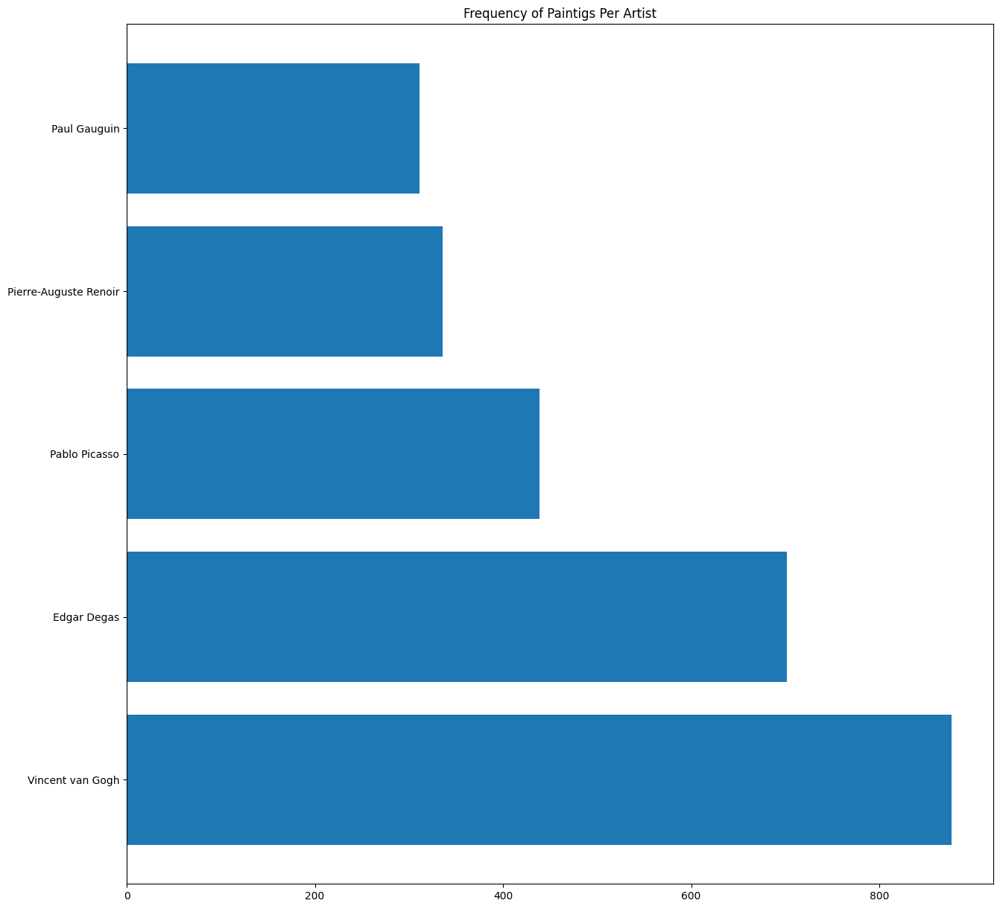

In [39]:
# Horizontal Bar Graph of Frequency of Paintigs Per Artist
y = list(artists_top["name"])
frequency = list(artists_top["paintings"])

x_pos = range(len(frequency))

plt.figure(figsize=(15,15))
plt.barh(x_pos, frequency)
plt.title("Frequency of Paintigs Per Artist")

plt.yticks(x_pos, y)

plt.show()

In [40]:
# add class weights due to imbalanced dataset
artists_top['class_weight'] = artists_top.paintings.sum() / (artists_top.shape[0] * artists_top.paintings)
artists_top

,name,years,genre,nationality,bio,wikipedia,paintings,class_weight
0,Vincent van Gogh,1853 – 1890,Post-Impressionism,Dutch,Vincent Willem van Gogh (Dutch: [ˈvɪnsɛnt ˈʋɪl...,http://en.wikipedia.org/wiki/Vincent_van_Gogh,877,0.607754
1,Edgar Degas,1834 - 1917,Impressionism,French,Edgar Degas (US: or UK: ; born Hilaire-Germai...,http://en.wikipedia.org/wiki/Edgar_Degas,702,0.759259
2,Pablo Picasso,1881 - 1973,Cubism,Spanish,Pablo Ruiz Picasso (; Spanish: [ˈpaβlo piˈkaso...,http://en.wikipedia.org/wiki/Pablo_Picasso,439,1.214123
3,Pierre-Auguste Renoir,1841 - 1919,Impressionism,French,"Pierre-Auguste Renoir, commonly known as Augus...",http://en.wikipedia.org/wiki/Pierre-Auguste_Re...,336,1.586310
4,Paul Gauguin,1848 – 1903,"Symbolism,Post-Impressionism",French,"Eugène Henri Paul Gauguin (UK: , US: ; French:...",http://en.wikipedia.org/wiki/Paul_Gauguin,311,1.713826


In [41]:
# create class weights
class_weights = artists_top['class_weight'].to_dict()
class_weights

{0: 0.6077537058152793,
 1: 0.7592592592592593,
 2: 1.214123006833713,
 3: 1.5863095238095237,
 4: 1.7138263665594855}

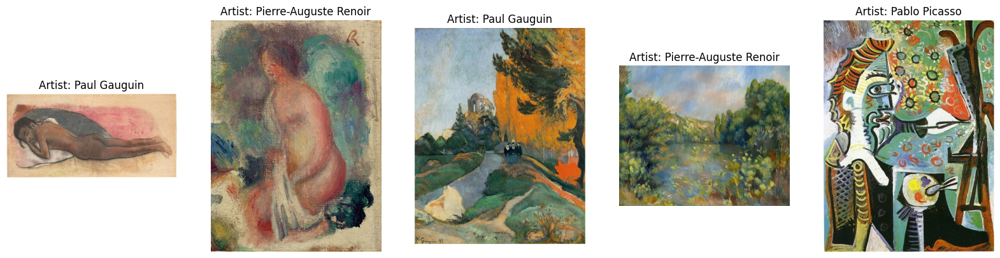

In [42]:
# print 5 random paintings
n = 5
fig, axes = plt.subplots(1, n, figsize=(20,10))

for i in range(n):
    artists_top_name = artists_top['name'].str.replace(' ', '_').values
    random_artist = random.choice(artists_top_name)
    random_image = random.choice(os.listdir(os.path.join(images_dir, random_artist)))
    random_image_file = os.path.join(images_dir, random_artist, random_image)
    image = plt.imread(random_image_file)
    axes[i].imshow(image)
    axes[i].set_title("Artist: " + random_artist.replace('_', ' '))
    axes[i].axis('off')

plt.show()

## 3. Data Augmentation

In [43]:
batch_size = 16
train_input_shape = (224, 224, 3)
n_classes = artists_top.shape[0]
artists_top_name_list = artists_top['name'].str.replace(' ', '_').values.tolist()

datagen = keras.preprocessing.image.ImageDataGenerator(
    validation_split=0.2,
    rescale=1./255.,
    shear_range=5,
    #zoom_range=0.7,
    #rotation_range=45,
    horizontal_flip=True,
    vertical_flip=True,
    )

train_generator = datagen.flow_from_directory(
    directory=images_dir,
    class_mode='categorical',
    target_size=train_input_shape[0:2],
    batch_size=batch_size,
    subset="training",
    shuffle=True,
    classes=artists_top_name_list, 
    )

valid_generator = datagen.flow_from_directory(
    directory=images_dir,
    class_mode='categorical',
    target_size=train_input_shape[0:2],
    batch_size=batch_size,
    subset="validation",
    shuffle=True,
    classes=artists_top_name_list,
    )

step_size_train = train_generator.n//train_generator.batch_size
step_size_valid = valid_generator.n//valid_generator.batch_size

print("Total number of training batches =", step_size_train)
print("Total number of validation batches =", step_size_valid)

Found 2134 images belonging to 5 classes.
Found 531 images belonging to 5 classes.
Total number of training batches = 133
Total number of validation batches = 33


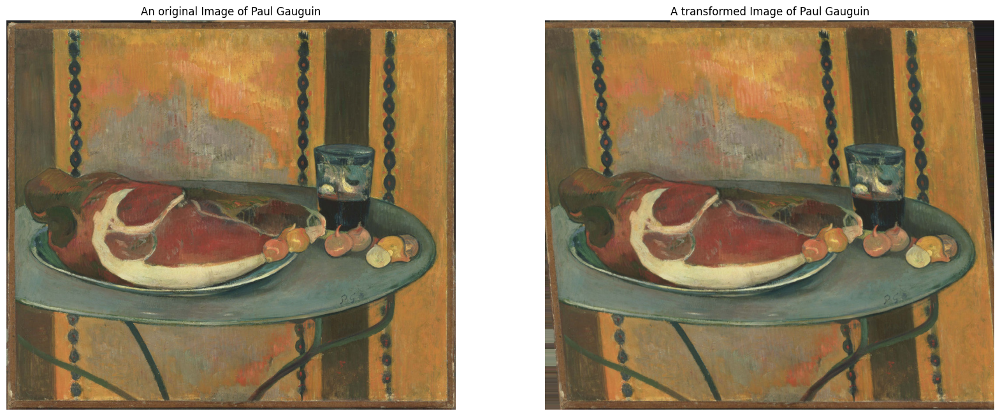

In [44]:
# print a random painting and its augmented version
fig, axes = plt.subplots(1, 2, figsize=(20,10))

artists_top_name = artists_top['name'].str.replace(' ', '_').values
random_artist = random.choice(artists_top_name)
random_image = random.choice(os.listdir(os.path.join(images_dir, random_artist)))
random_image_file = os.path.join(images_dir, random_artist, random_image)

# Original image
image = plt.imread(random_image_file)
axes[0].imshow(image)
axes[0].set_title("An original Image of " + random_artist.replace('_', ' '))
axes[0].axis('off')

# Transformed image
aug_image = datagen.random_transform(image)
axes[1].imshow(aug_image)
axes[1].set_title("A transformed Image of " + random_artist.replace('_', ' '))
axes[1].axis('off')

plt.show()

## 4. Build Model

In [45]:
# Load pre-trained model
base_model = keras.applications.ResNet50(
    weights='imagenet', 
    include_top=False, 
    input_shape=train_input_shape
    )

for layer in base_model.layers:
    layer.trainable = True

In [46]:
# ADD new layers for the fine-tuning task
X = base_model.output
X = keras.layers.GlobalAveragePooling2D()(X)  # Added a global average pooling layer
X = keras.layers.Dense(512, kernel_initializer='he_uniform')(X)
X = keras.layers.Dropout(0.5)(X)  # Reintroduce Dropout
X = keras.layers.BatchNormalization()(X)
X = keras.layers.Activation('relu')(X)

X = keras.layers.Dense(16, kernel_initializer='he_uniform')(X)
X = keras.layers.Dropout(0.5)(X)  # Another Dropout layer
X = keras.layers.BatchNormalization()(X)
X = keras.layers.Activation('relu')(X)

output = keras.layers.Dense(n_classes, activation='softmax')(X)
model = keras.Model(inputs=base_model.input, outputs=output)

In [47]:
model.compile(loss='categorical_crossentropy',
              optimizer=keras.optimizers.Adam(learning_rate=0.0001), 
              metrics=['accuracy'])

## 5. Train Model

In [48]:

early_stop = keras.callbacks.EarlyStopping(
    patience=20, 
    verbose=1, 
    restore_best_weights=True
    )

reduce_lr = keras.callbacks.ReduceLROnPlateau(
    patience=5, 
    verbose=1, 
    )

In [49]:
# Train the model - all layers
n_epoch = 10

history1 = model.fit(
    train_generator, 
    steps_per_epoch=step_size_train, 
    validation_data=valid_generator, 
    validation_steps=step_size_valid,
    epochs=n_epoch, 
    shuffle=True,
    verbose=1,
    callbacks=[reduce_lr],
    class_weight=class_weights, 
    )

Epoch 1/10
133/133 [==============================] - 245s 2s/step - loss: 1.3634 - accuracy: 0.3886 - val_loss: 1.8488 - val_accuracy: 0.1269 - lr: 1.0000e-04
Epoch 2/10
133/133 [==============================] - 223s 2s/step - loss: 1.0356 - accuracy: 0.5883 - val_loss: 1.7765 - val_accuracy: 0.1629 - lr: 1.0000e-04
Epoch 3/10
133/133 [==============================] - 226s 2s/step - loss: 0.9271 - accuracy: 0.6686 - val_loss: 1.6149 - val_accuracy: 0.1364 - lr: 1.0000e-04
Epoch 4/10
133/133 [==============================] - 218s 2s/step - loss: 0.8665 - accuracy: 0.7040 - val_loss: 1.9846 - val_accuracy: 0.1402 - lr: 1.0000e-04
Epoch 5/10
133/133 [==============================] - 221s 2s/step - loss: 0.8414 - accuracy: 0.7299 - val_loss: 2.4135 - val_accuracy: 0.1439 - lr: 1.0000e-04
Epoch 6/10
133/133 [==============================] - 217s 2s/step - loss: 0.7910 - accuracy: 0.7441 - val_loss: 1.6326 - val_accuracy: 0.3409 - lr: 1.0000e-04
Epoch 7/10
133/133 [====================

In [50]:
# Freeze core ResNet layers and train again 
for layer in model.layers[50:]:
    layer.trainable = False


model.compile(
    loss='categorical_crossentropy',
    optimizer=keras.optimizers.Adam(learning_rate=0.0001), 
    metrics=['accuracy']
    )

n_epoch = 50
history2 = model.fit(
    train_generator, 
    steps_per_epoch=step_size_train,
    validation_data=valid_generator, 
    validation_steps=step_size_valid,
    epochs=n_epoch,
    shuffle=True,
    verbose=1,
    callbacks=[reduce_lr, early_stop],
    class_weight=class_weights, 
    )

Epoch 1/50
133/133 [==============================] - 178s 1s/step - loss: 0.4176 - accuracy: 0.8895 - val_loss: 0.5597 - val_accuracy: 0.8504 - lr: 1.0000e-04
Epoch 2/50
133/133 [==============================] - 169s 1s/step - loss: 0.3867 - accuracy: 0.8928 - val_loss: 0.5164 - val_accuracy: 0.8542 - lr: 1.0000e-04
Epoch 3/50
133/133 [==============================] - 170s 1s/step - loss: 0.3645 - accuracy: 0.8966 - val_loss: 0.5069 - val_accuracy: 0.8731 - lr: 1.0000e-04
Epoch 4/50
133/133 [==============================] - 165s 1s/step - loss: 0.3622 - accuracy: 0.8938 - val_loss: 0.4560 - val_accuracy: 0.8769 - lr: 1.0000e-04
Epoch 5/50
133/133 [==============================] - 169s 1s/step - loss: 0.3662 - accuracy: 0.8886 - val_loss: 0.4785 - val_accuracy: 0.8731 - lr: 1.0000e-04
Epoch 6/50
133/133 [==============================] - 168s 1s/step - loss: 0.3556 - accuracy: 0.8867 - val_loss: 0.4270 - val_accuracy: 0.8788 - lr: 1.0000e-04
Epoch 7/50
133/133 [====================

## 6. Performance Evaluation

In [51]:
# Merge history1 and history2
history = {}
history['loss'] = history1.history['loss'] + history2.history['loss']
history['accuracy'] = history1.history['accuracy'] + history2.history['accuracy']
history['val_loss'] = history1.history['val_loss'] + history2.history['val_loss']
history['val_accuracy'] = history1.history['val_accuracy'] + history2.history['val_accuracy']
history['lr'] = history1.history['lr'] + history2.history['lr']

In [52]:
print("history1:", history1.history.keys())
print("history2:", history2.history.keys())
print("history:", history.keys())

history1: dict_keys(['loss', 'accuracy', 'val_loss', 'val_accuracy', 'lr'])
history2: dict_keys(['loss', 'accuracy', 'val_loss', 'val_accuracy', 'lr'])
history: dict_keys(['loss', 'accuracy', 'val_loss', 'val_accuracy', 'lr'])


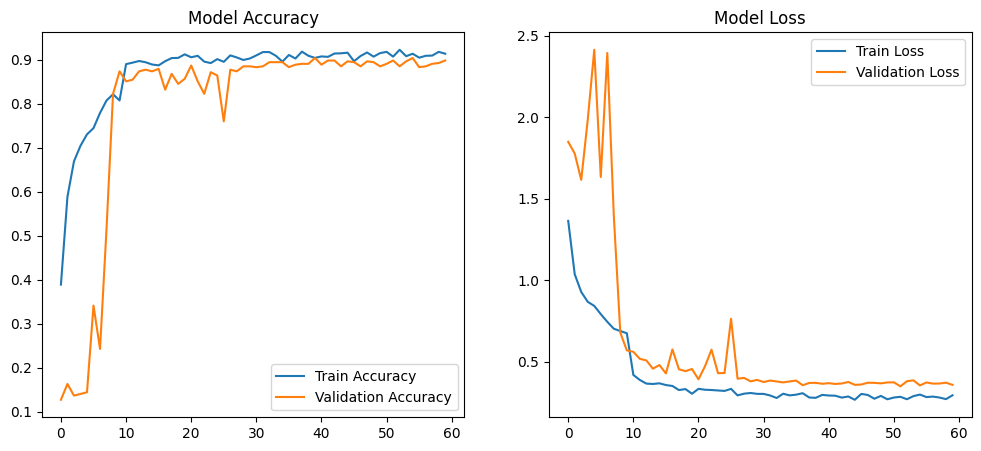

In [53]:
# plot training and validation accuracy and loss
def plot_training(history):
    plt.figure(figsize=(12, 5))
    plt.subplot(1, 2, 1)
    plt.plot(history['accuracy'], label='Train Accuracy')
    plt.plot(history['val_accuracy'], label='Validation Accuracy')
    plt.title('Model Accuracy')
    plt.legend()

    plt.subplot(1, 2, 2)
    plt.plot(history['loss'], label='Train Loss')
    plt.plot(history['val_loss'], label='Validation Loss')
    plt.title('Model Loss')
    plt.legend()

    plt.show()

plot_training(history)

In [54]:
# evaluate the model on training set
train_scores = model.evaluate(train_generator, verbose=1)
print("Training Accuracy:", train_scores[1])

134/134 [==============================] - 46s 341ms/step - loss: 0.0899 - accuracy: 0.9958
Training Accuracy: 0.9957825541496277


In [55]:
# evaluate the model on validation set
valid_scores = model.evaluate(valid_generator, verbose=1)
print("Validation Accuracy:", valid_scores[1])

34/34 [==============================] - 11s 330ms/step - loss: 0.3589 - accuracy: 0.9077
Validation Accuracy: 0.9077212810516357


1/1 [==============================] - 0s 289ms/step


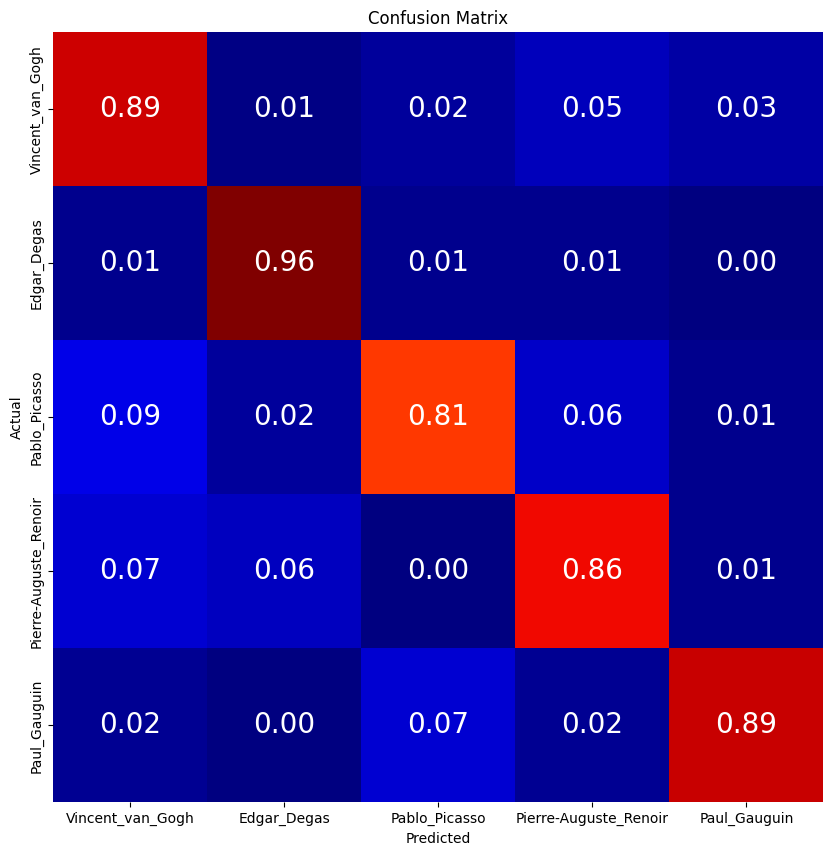

Classification Report:
                       precision    recall  f1-score   support

     Vincent_van_Gogh       0.91      0.89      0.90       164
          Edgar_Degas       0.95      0.96      0.95       141
        Pablo_Picasso       0.87      0.81      0.84        81
Pierre-Auguste_Renoir       0.79      0.86      0.83        72
         Paul_Gauguin       0.88      0.89      0.89        57

             accuracy                           0.89       515
            macro avg       0.88      0.88      0.88       515
         weighted avg       0.89      0.89      0.89       515



In [83]:
# Classification report and confusion matrix

tick_labels = artists_top_name.tolist()

def showClassficationReport_Generator(model, valid_generator, step_size_valid):
    # Loop on each generator batch and predict
    y_pred, y_true = [], []
    for i in range(step_size_valid):
        (X,y) = next(valid_generator)
        y_pred.append(model.predict(X))
        y_true.append(y)
    
    # Create a flat list for y_true and y_pred
    y_pred = [subresult for result in y_pred for subresult in result]
    y_true = [subresult for result in y_true for subresult in result]
    
    # Update Truth vector based on argmax
    y_true = np.argmax(y_true, axis=1)
    y_true = np.asarray(y_true).ravel()
    
    # Update Prediction vector based on argmax
    y_pred = np.argmax(y_pred, axis=1)
    y_pred = np.asarray(y_pred).ravel()
    
    # Confusion Matrix
    fig, ax = plt.subplots(figsize=(10,10))
    conf_matrix = confusion_matrix(y_true, y_pred, labels=np.arange(n_classes))
    conf_matrix = conf_matrix / np.sum(conf_matrix, axis=1, keepdims=True)  
    sns.heatmap(
        conf_matrix, annot=True, 
        fmt=".2f", annot_kws={"size": 20}, 
        square=True, cbar=False, 
        cmap=plt.cm.jet, 
        xticklabels=tick_labels, yticklabels=tick_labels, 
        ax=ax)

    ax.set_ylabel('Actual')
    ax.set_xlabel('Predicted')
    ax.set_title('Confusion Matrix')
    plt.show()
    
    print('Classification Report:')
    print(classification_report(y_true, y_pred, labels=np.arange(n_classes), target_names=artists_top_name.tolist()))

showClassficationReport_Generator(model, valid_generator, step_size_valid)

1/1 [==============================] - 0s 61ms/step


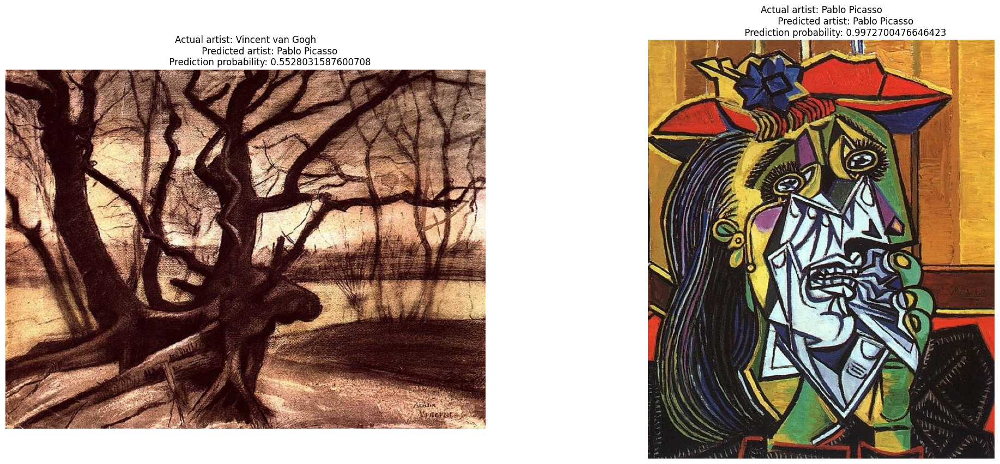

1/1 [==============================] - 0s 61ms/step


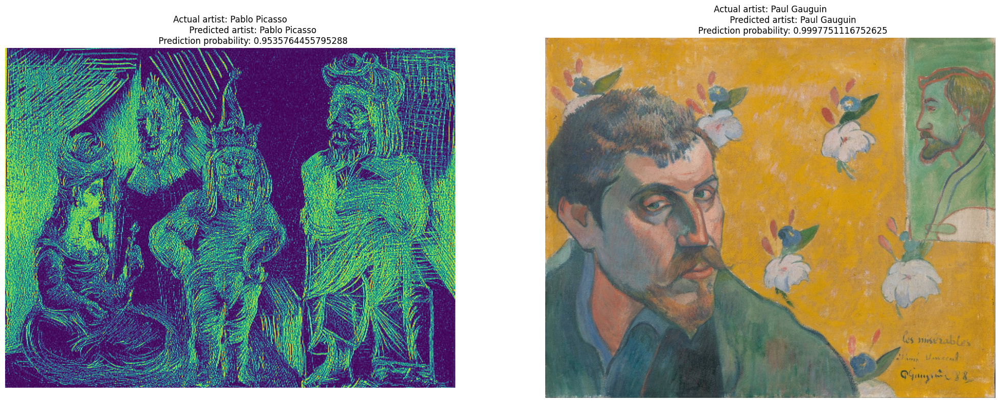

In [57]:
def display_image_grid(model, train_generator, n=1):
    fig, axes = plt.subplots(1, n, figsize=(25,10))

    for i in range(n):
        random_artist = random.choice(artists_top_name)
        random_image = random.choice(os.listdir(os.path.join(images_dir, random_artist)))
        random_image_file = os.path.join(images_dir, random_artist, random_image)

        # Original image

        test_image = keras.preprocessing.image.load_img(random_image_file, target_size=(train_input_shape[0:2]))

        # Predict artist
        test_image = keras.preprocessing.image.img_to_array(test_image)
        test_image /= 255.
        test_image = np.expand_dims(test_image, axis=0)

        prediction = model.predict(test_image)
        prediction_probability = np.amax(prediction)
        prediction_idx = np.argmax(prediction)

        labels = train_generator.class_indices
        labels = dict((v,k) for k,v in labels.items())


        title = f"Actual artist: {random_artist.replace('_', ' ')}\n \
                Predicted artist: {labels[prediction_idx].replace('_', ' ')}\n \
                Prediction probability: {prediction_probability}" 
        
        # Print image
        axes[i].imshow(plt.imread(random_image_file))
        axes[i].set_title(title)
        axes[i].axis('off')

    plt.show()

display_image_grid(model, train_generator, n=2)
display_image_grid(model, train_generator, n=2)

In [58]:
# Saving the Model

current_time = datetime.datetime.now().strftime("%Y-%m-%d_%H-%M-%S")
path = f'identify_artist_{current_time}.keras'

model.save(path)

print(f"Model saved as {path}")


Model saved as identify_artist_2024-07-20_00-32-17.keras
